In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization, Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Model

In [3]:
# Define parameters
img_size = (256, 256, 3)

# Load and preprocess the dataset
dataset_dir = "PlantVillage"
batch_size = 32

dataset = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_dir,
    shuffle=True,
    image_size=img_size[:2],
    batch_size=batch_size,
)

# Extract class names before mapping the dataset
class_names = dataset.class_names
num_classes = len(class_names)


Found 2152 files belonging to 3 classes.


In [4]:
# Normalize and split the dataset
dataset = dataset.map(lambda x, y: (tf.cast(x, tf.float32) / 255.0, y))

# Calculate validation size and split the dataset
dataset_size = len(list(dataset))
val_size = int(0.2 * dataset_size)
val_dataset = dataset.take(val_size)
train_dataset = dataset.skip(val_size)

# Build the autoencoder model
def build_autoencoder(input_shape):
    input_image = Input(shape=input_shape)
    # Encoder
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(input_image)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    # Decoder
    up1 = UpSampling2D((2, 2))(conv3)
    conv4 = Conv2D(64, (3, 3), activation='relu', padding='same')(up1)
    conv4 = BatchNormalization()(conv4)
    up2 = UpSampling2D((2, 2))(conv4)
    decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(up2)
    encoder = Model(input_image, conv3)  # Encoder model
    autoencoder = Model(input_image, decoded)  # Full autoencoder model
    return encoder, autoencoder

In [5]:
# Build the autoencoder and encoder models
encoder, autoencoder = build_autoencoder(img_size)

# Compile the autoencoder
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')

# Train the autoencoder
history_ae = autoencoder.fit(
    train_dataset.map(lambda x, y: (x, x)),
    epochs=30,
    validation_data=val_dataset.map(lambda x, y: (x, x))
)

# Build the classifier model
def build_classifier(encoder, num_classes):
    for layer in encoder.layers:
        layer.trainable = False  # Freeze the encoder layers
    flat = GlobalAveragePooling2D()(encoder.output)
    dense1 = Dense(128, activation='relu')(flat)
    output = Dense(num_classes, activation='softmax')(dense1)
    classifier = Model(encoder.input, output)
    return classifier

classifier = build_classifier(encoder, num_classes)




Epoch 1/30

55/55 [==============================] - 634s 11s/step - loss: 0.6400 - val_loss: 0.6807
Epoch 2/30
55/55 [==============================] - 476s 9s/step - loss: 0.6200 - val_loss: 0.6758
Epoch 3/30
55/55 [==============================] - 481s 9s/step - loss: 0.6184 - val_loss: 0.6691
Epoch 4/30
55/55 [==============================] - 485s 9s/step - loss: 0.6178 - val_loss: 0.6577
Epoch 5/30
55/55 [==============================] - 482s 9s/step - loss: 0.6174 - val_loss: 0.6458
Epoch 6/30
55/55 [==============================] - 483s 9s/step - loss: 0.6171 - val_loss: 0.6360
Epoch 7/30
55/55 [==============================] - 462s 8s/step - loss: 0.6168 - val_loss: 0.6279
Epoch 8/30
55/55 [==============================] - 452s 8s/step - loss: 0.6162 - val_loss: 0.6227
Epoch 9/30
55/55 [==============================] - 453s 8s/step - loss: 0.6164 - val_loss: 0.6195
Epoch 10/30
55/55 [==============================] - 453s 8s/step - loss: 0.6159 - val_loss: 0.6166
Epoc

In [6]:
# Compile the classifier
classifier.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the classifier
history_clf = classifier.fit(
    train_dataset,
    epochs=10,
    validation_data=val_dataset
)

Epoch 1/10

55/55 [==============================] - 60s 757ms/step - loss: 0.5272 - accuracy: 0.8059 - val_loss: 0.3957 - val_accuracy: 0.8798
Epoch 2/10
55/55 [==============================] - 41s 740ms/step - loss: 0.3013 - accuracy: 0.8952 - val_loss: 0.3189 - val_accuracy: 0.9087
Epoch 3/10
55/55 [==============================] - 41s 739ms/step - loss: 0.2352 - accuracy: 0.9286 - val_loss: 0.2852 - val_accuracy: 0.8990
Epoch 4/10
55/55 [==============================] - 42s 744ms/step - loss: 0.2072 - accuracy: 0.9338 - val_loss: 0.2125 - val_accuracy: 0.9255
Epoch 5/10
55/55 [==============================] - 42s 750ms/step - loss: 0.1860 - accuracy: 0.9355 - val_loss: 0.2105 - val_accuracy: 0.9255
Epoch 6/10
55/55 [==============================] - 41s 742ms/step - loss: 0.1662 - accuracy: 0.9459 - val_loss: 0.1877 - val_accuracy: 0.9351
Epoch 7/10
55/55 [==============================] - 41s 738ms/step - loss: 0.1478 - accuracy: 0.9539 - val_loss: 0.1737 - val_accuracy: 0.935

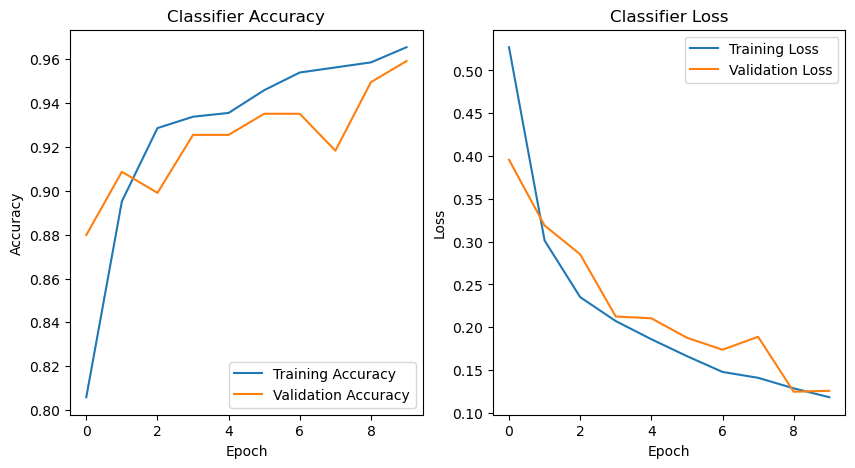

In [7]:
# Plot training & validation accuracy and loss values
def plot_history(history, title):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{title} Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='lower right')

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{title} Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')

    plt.show()

plot_history(history_clf, 'Classifier')

1/1 [==============================] - 4s 4s/step


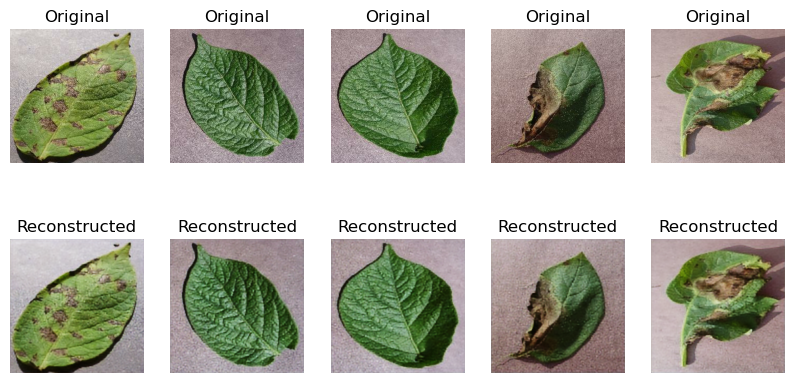

In [8]:
# Display reconstructed images after training
def display_reconstructed_images(model, dataset):
    num_images = 5
    plt.figure(figsize=(10, 5))
    for images, _ in dataset.take(1):
        reconstructed_images = model.predict(images)
        for i in range(num_images):
            plt.subplot(2, num_images, i + 1)
            plt.imshow(images[i].numpy())
            plt.title("Original")
            plt.axis("off")
            plt.subplot(2, num_images, i + num_images + 1)
            plt.imshow(reconstructed_images[i])
            plt.title("Reconstructed")
            plt.axis("off")
        plt.show()

display_reconstructed_images(autoencoder, val_dataset)


In [9]:
# Calculate reconstruction loss
def calculate_reconstruction_loss(model, dataset):
    total_loss = 0.0
    num_batches = 0
    for images, _ in dataset:
        reconstructed_images = model.predict(images)
        batch_loss = tf.keras.losses.binary_crossentropy(images, reconstructed_images)
        total_loss += tf.reduce_mean(batch_loss)
        num_batches += 1
    return total_loss / num_batches

reconstruction_loss = calculate_reconstruction_loss(autoencoder, val_dataset)
print("Average Reconstruction Loss:", reconstruction_loss)

1/1 [==============================] - 2s 2s/step
Average Reconstruction Loss: tf.Tensor(0.6140869, shape=(), dtype=float32)


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 55ms/step


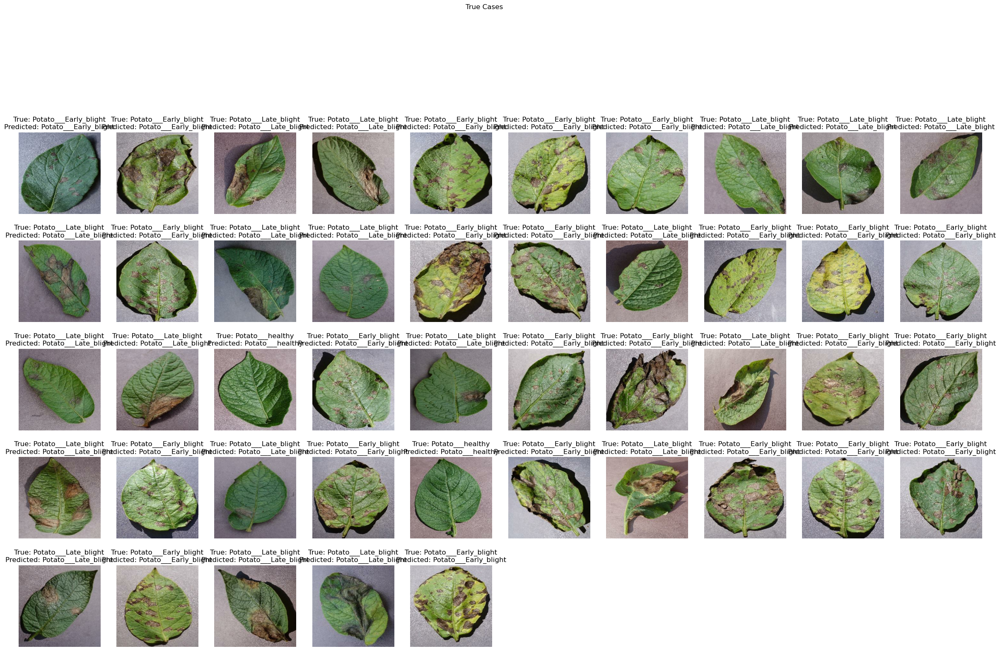

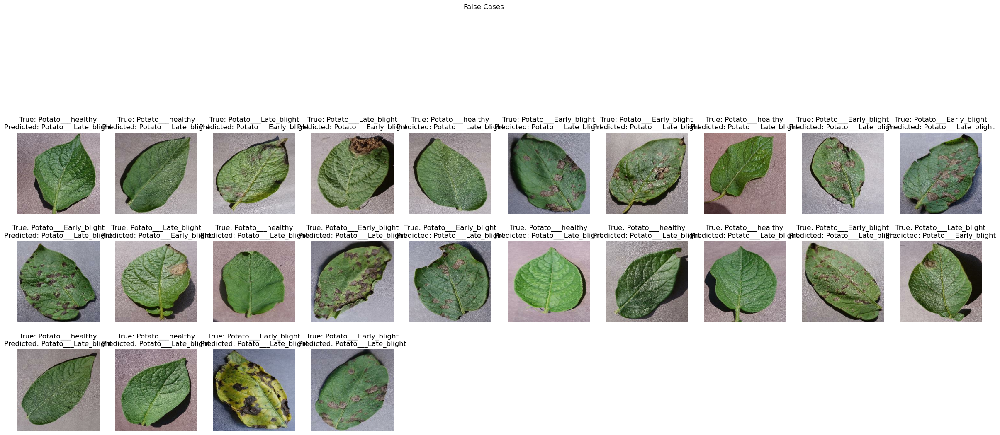

Diagnosing false cases:
Case 1:
True Label: Potato___healthy
Predicted Label: Potato___Late_blight


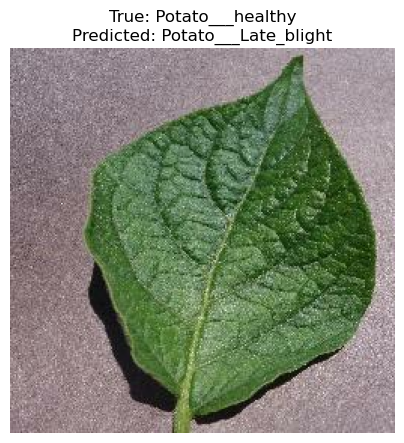

Case 2:
True Label: Potato___healthy
Predicted Label: Potato___Late_blight


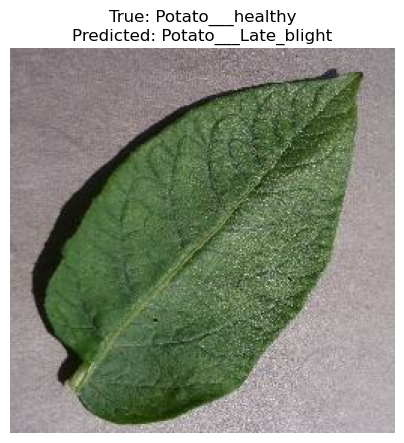

Case 3:
True Label: Potato___Late_blight
Predicted Label: Potato___Early_blight


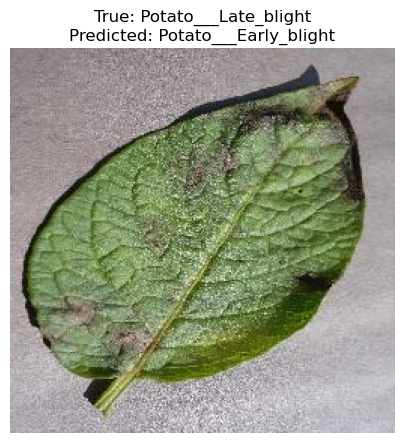

Case 4:
True Label: Potato___Late_blight
Predicted Label: Potato___Early_blight


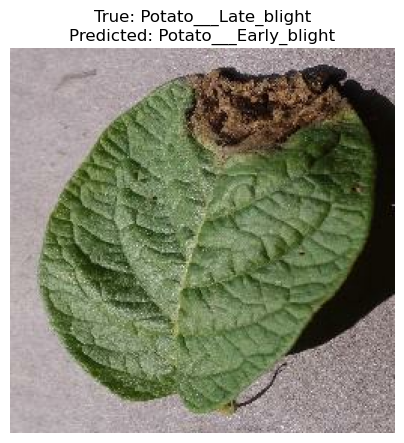

Case 5:
True Label: Potato___healthy
Predicted Label: Potato___Late_blight


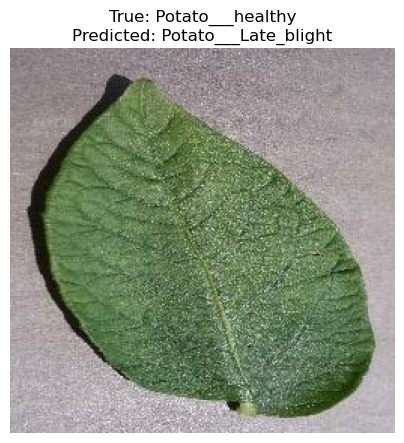

Case 6:
True Label: Potato___Early_blight
Predicted Label: Potato___Late_blight


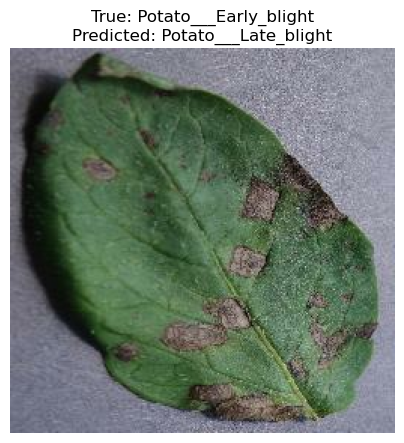

Case 7:
True Label: Potato___Early_blight
Predicted Label: Potato___Late_blight


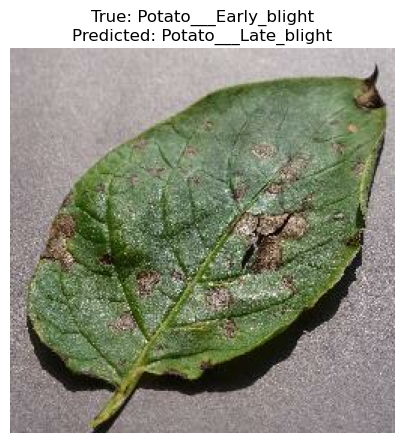

Case 8:
True Label: Potato___healthy
Predicted Label: Potato___Late_blight


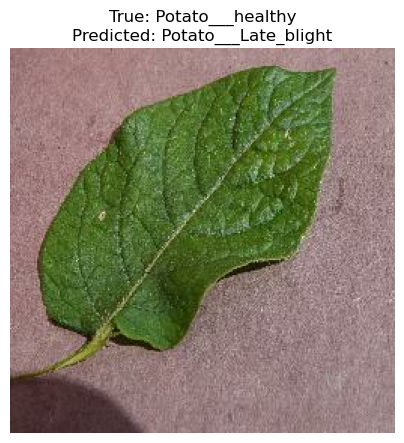

Case 9:
True Label: Potato___Early_blight
Predicted Label: Potato___Late_blight


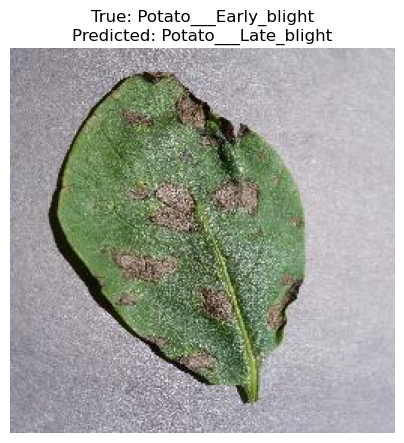

Case 10:
True Label: Potato___Early_blight
Predicted Label: Potato___Late_blight


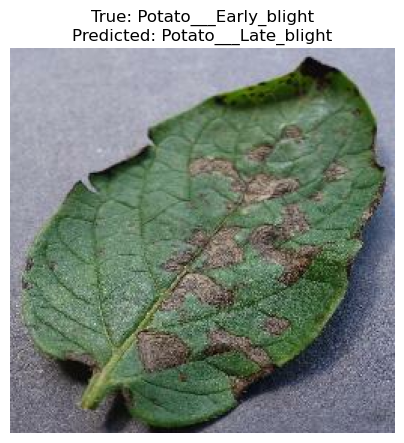

Case 11:
True Label: Potato___Early_blight
Predicted Label: Potato___Late_blight


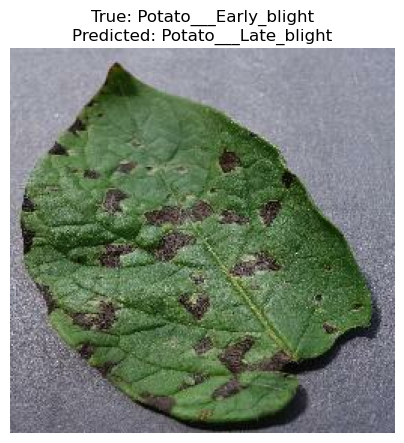

Case 12:
True Label: Potato___Late_blight
Predicted Label: Potato___Early_blight


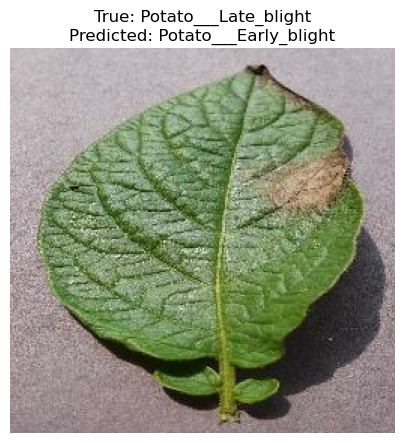

Case 13:
True Label: Potato___healthy
Predicted Label: Potato___Late_blight


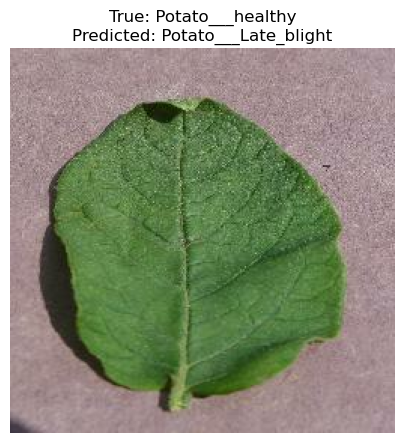

Case 14:
True Label: Potato___Early_blight
Predicted Label: Potato___Late_blight


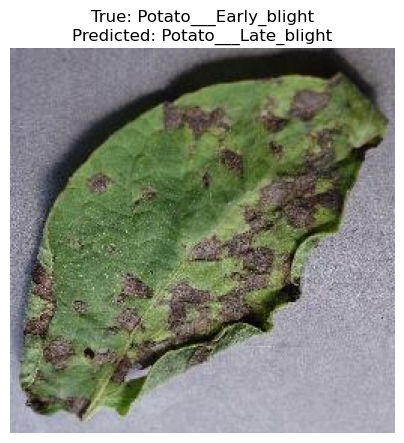

Case 15:
True Label: Potato___Early_blight
Predicted Label: Potato___Late_blight


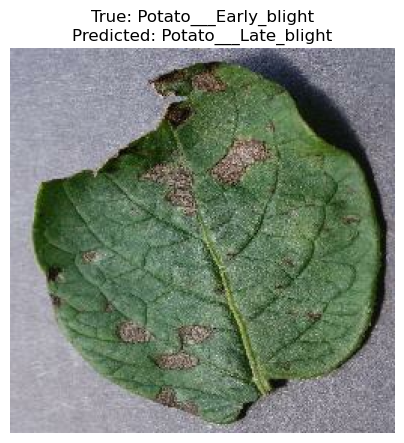

Case 16:
True Label: Potato___healthy
Predicted Label: Potato___Late_blight


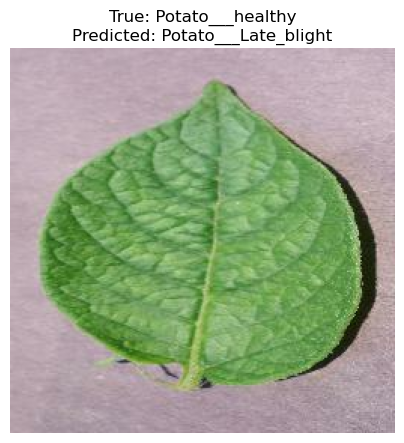

Case 17:
True Label: Potato___healthy
Predicted Label: Potato___Late_blight


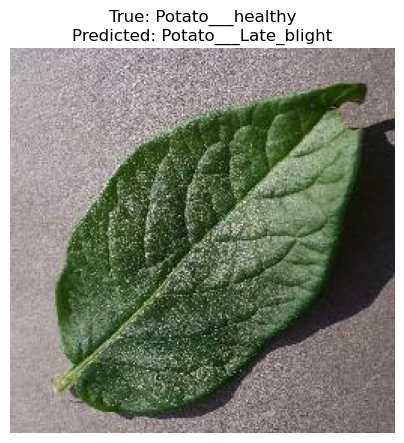

Case 18:
True Label: Potato___healthy
Predicted Label: Potato___Late_blight


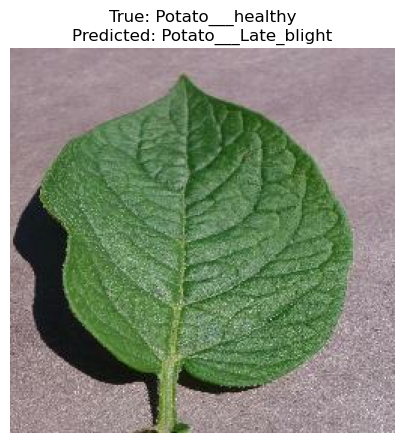

Case 19:
True Label: Potato___Early_blight
Predicted Label: Potato___Late_blight


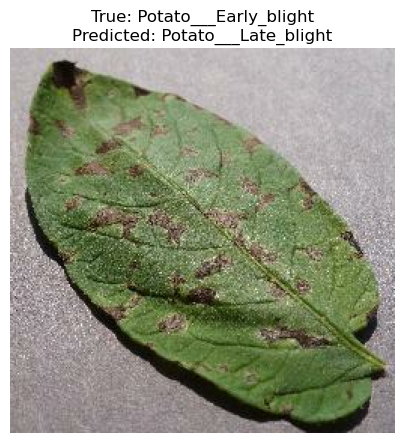

Case 20:
True Label: Potato___Late_blight
Predicted Label: Potato___Early_blight


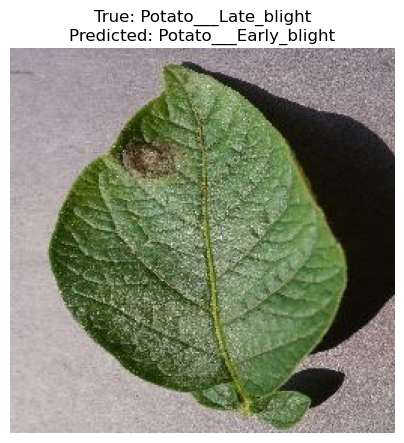

Case 21:
True Label: Potato___healthy
Predicted Label: Potato___Late_blight


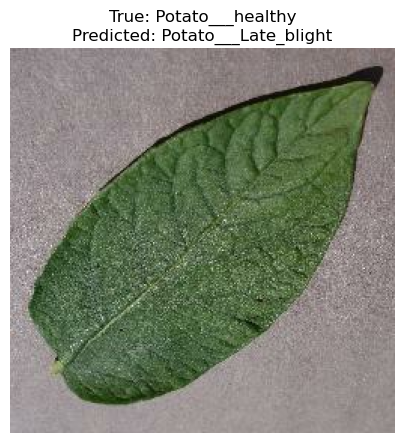

Case 22:
True Label: Potato___healthy
Predicted Label: Potato___Late_blight


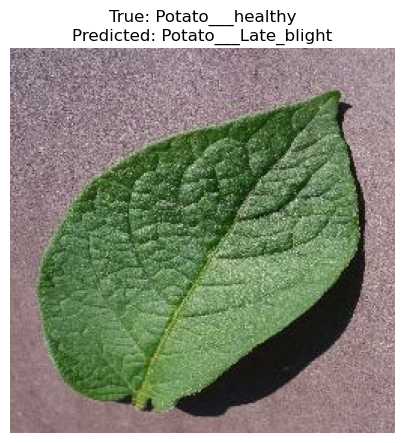

Case 23:
True Label: Potato___Early_blight
Predicted Label: Potato___Late_blight


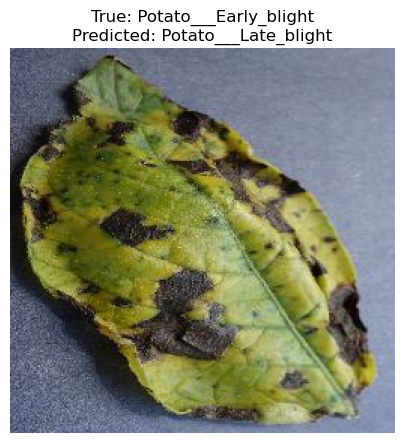

Case 24:
True Label: Potato___Early_blight
Predicted Label: Potato___Late_blight


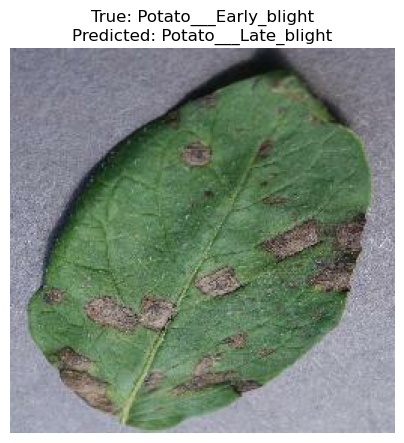

In [10]:
# Predict disease and display the result for multiple images, differentiating between true and false predictions
def predict_and_display_true_false_cases(model, dataset, img_size, num_images=45):
    true_cases = []
    false_cases = []
    for images, labels in dataset:
        for i in range(batch_size):
            if len(true_cases) >= num_images and len(false_cases) >= num_images:
                break
            image = images[i].numpy()
            true_label = class_names[labels[i].numpy()]
            image_array_expanded = np.expand_dims(image, axis=0)
            prediction = model.predict(image_array_expanded)
            predicted_class = np.argmax(prediction, axis=1)[0]
            predicted_class_name = class_names[predicted_class]

            if predicted_class_name == true_label:
                if len(true_cases) < num_images:
                    true_cases.append((image, true_label, predicted_class_name))
            else:
                if len(false_cases) < num_images:
                    false_cases.append((image, true_label, predicted_class_name))

        if len(true_cases) >= num_images and len(false_cases) >= num_images:
            break
    
    # Display true cases
    plt.figure(figsize=(30, 30))
    for i, (image, true_label, predicted_class_name) in enumerate(true_cases):
        plt.subplot(9, 10, i + 1)
        plt.imshow(image)
        plt.title(f"True: {true_label}\nPredicted: {predicted_class_name}")
        plt.axis("off")
    plt.suptitle("True Cases")
    plt.show()

    # Display false cases
    plt.figure(figsize=(30, 30))
    for i, (image, true_label, predicted_class_name) in enumerate(false_cases):
        plt.subplot(9, 10, i + 1)
        plt.imshow(image)
        plt.title(f"True: {true_label}\nPredicted: {predicted_class_name}")
        plt.axis("off")
    plt.suptitle("False Cases")
    plt.show()

    return false_cases

# Example usage: Predict and display the result for multiple leaves from the validation dataset
false_cases = predict_and_display_true_false_cases(classifier, val_dataset, img_size)

# Diagnose false/negative results
def diagnose_false_cases(false_cases):
    print("Diagnosing false cases:")
    for i, (image, true_label, predicted_class_name) in enumerate(false_cases):
        print(f"Case {i + 1}:")
        print(f"True Label: {true_label}")
        print(f"Predicted Label: {predicted_class_name}")
        plt.figure(figsize=(5, 5))
        plt.imshow(image)
        plt.title(f"True: {true_label}\nPredicted: {predicted_class_name}")
        plt.axis("off")
        plt.show()

# Example usage: Diagnose false/negative results
diagnose_false_cases(false_cases)

In [11]:
# Evaluate the model on the validation dataset
val_loss, val_accuracy = classifier.evaluate(val_dataset)
print(f"Validation Accuracy: {val_accuracy}")


13/13 [==============================] - 8s 609ms/step - loss: 0.1444 - accuracy: 0.9543
Validation Accuracy: 0.9543269276618958
